<a href="https://colab.research.google.com/github/Elman295/DCGAN_CIFAR10/blob/main/DCGAN_CIFAR10_TensorFlow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt 

In [2]:
data = tf.keras.datasets.cifar10 

(x_train, y_train), (_,_) = data.load_data()

170498071/170498071 [==============================] - 4s 0us/step


In [3]:
print(x_train.shape)
print(x_train.dtype)

(50000, 32, 32, 3)
uint8


In [4]:
x_train = x_train.astype("float32") 
print(x_train.dtype)

float32


In [5]:
x_train = (x_train - 127.5) / 127.5

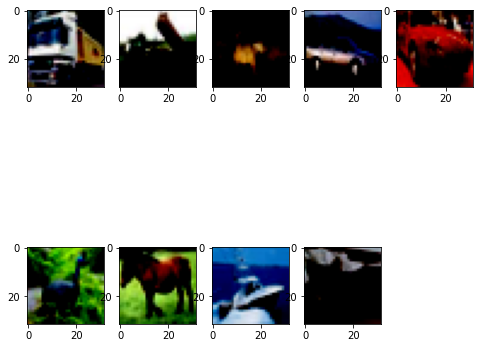

In [6]:
plt.figure(figsize = (8,8))
for i in range(1,10):
  plt.subplot(2,5,i)
  plt.imshow(x_train[i])
plt.show()

In [7]:
train_data = tf.data.Dataset.from_tensor_slices(tensors = (x_train)).shuffle(60000).batch(128) 

In [87]:
class Generator(tf.keras.models.Model):

  """


  Acting as Artist

  Generating the fake images from CIFAR_10 dataset
  
  
  
  """

  def __init__(self):
    super(Generator, self).__init__()
    self.d1 = tf.keras.layers.Dense(8*8*256, input_shape =(100,), use_bias=False) 
    self.BN_0 = tf.keras.layers.BatchNormalization() 
    self.act_0 = tf.keras.layers.LeakyReLU()

    self.reshape = tf.keras.layers.Reshape(target_shape =(8,8,256) )

    self.convT1 = tf.keras.layers.Conv2DTranspose(128,(5,5),strides = (1,1),padding ="same", use_bias=False) #(8,8,128)
    self.BN_1 = tf.keras.layers.BatchNormalization() 
    self.act_1 = tf.keras.layers.LeakyReLU() 

    self.convT2 = tf.keras.layers.Conv2DTranspose(64,(5,5),strides = (2,2),padding = "same", use_bias=False) #(16,16,64)
    self.BN_2 = tf.keras.layers.BatchNormalization()
    self.act_2 = tf.keras.layers.LeakyReLU() 

    self.convT3 = tf.keras.layers.Conv2DTranspose(3, (5,5),padding = "same", use_bias = False, activation ="tanh", strides =(2,2)) # (32,32,3)



  def call(self,x):

    x = self.d1(x)
    x = self.BN_0(x)
    x = self.act_0(x) 

    x = self.reshape(x) 

    x = self.convT1(x)
    x = self.BN_1(x)
    x = self.act_1(x) 

    x = self.convT2(x)
    x = self.BN_2(x) 
    x = self.act_2(x) 

    logits = self.convT3(x)

    return logits


In [88]:
generator = Generator() 
noise = tf.random.normal(shape = (1,100))
generated_image = generator(noise, training = False) 
print(generated_image.shape)
print(generated_image.dtype)

(1, 32, 32, 3)
<dtype: 'float32'>


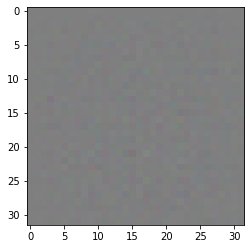

In [94]:
plt.imshow((generated_image[0,:,:]*127.5 +127.5).numpy().astype("uint8"))
plt.show()

In [95]:
generator.summary()

Model: "generator_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_11 (Dense)            multiple                  1638400   
                                                                 
 batch_normalization_21 (Bat  multiple                 65536     
 chNormalization)                                                
                                                                 
 leaky_re_lu_29 (LeakyReLU)  multiple                  0         
                                                                 
 reshape_7 (Reshape)         multiple                  0         
                                                                 
 conv2d_transpose_21 (Conv2D  multiple                 819200    
 Transpose)                                                      
                                                                 
 batch_normalization_22 (Bat  multiple                 

In [96]:
class Discriminator(tf.keras.models.Model):

  """


  Selecting the fake image from real image
  
  
  """


  def __init__(self):
    super(Discriminator, self).__init__()

    self.conv1 = tf.keras.layers.Conv2D(64,(5,5),padding = "same", strides =(2,2),input_shape = (32,32,3)) 
    self.act_1 = tf.keras.layers.LeakyReLU()
    self.drop_1 = tf.keras.layers.Dropout(0.3) 


    self.conv2 = tf.keras.layers.Conv2D(128,(5,5),padding = "same", strides =(2,2)) 
    self.act_2 = tf.keras.layers.LeakyReLU()
    self.drop_2 = tf.keras.layers.Dropout(0.3) 

    self.flatten = tf.keras.layers.Flatten() 
    self.d1 = tf.keras.layers.Dense(1) 


  def call(self,x):

    x = self.conv1(x) 
    x = self.act_1(x) 
    x = self.drop_1(x) 

    x = self.conv2(x)
    x = self.act_2(x)
    x = self.drop_2(x) 

    x = self.flatten(x) 
    logits = self.d1(x)
    return logits



In [97]:
discriminator = Discriminator()
print(discriminator(generated_image, training = False))

tf.Tensor([[-0.00037368]], shape=(1, 1), dtype=float32)


In [98]:
discriminator.summary()

Model: "discriminator_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           multiple                  4864      
                                                                 
 leaky_re_lu_32 (LeakyReLU)  multiple                  0         
                                                                 
 dropout_8 (Dropout)         multiple                  0         
                                                                 
 conv2d_9 (Conv2D)           multiple                  204928    
                                                                 
 leaky_re_lu_33 (LeakyReLU)  multiple                  0         
                                                                 
 dropout_9 (Dropout)         multiple                  0         
                                                                 
 flatten_4 (Flatten)         multiple              

In [99]:
BCE = tf.keras.losses.BinaryCrossentropy(from_logits = True) 

In [100]:
def loss_gen(fake):
  return BCE(tf.ones_like(fake),fake)

In [101]:
def loss_dis(real, fake):
  loss_real = BCE(tf.ones_like(real), real)
  loss_fake = BCE(tf.zeros_like(fake), fake) 
  loss = loss_real + loss_fake
  return loss

In [102]:
optimizer_gen = tf.keras.optimizers.Adam(1e-4)
optimizer_dis = tf.keras.optimizers.Adam(1e-4)

In [103]:
@tf.function
def train(image):

  noise = tf.random.normal(shape = (128,100))

  with tf.GradientTape() as g_tape, tf.GradientTape() as d_tape:

    generated_image = generator(noise, training = True) 
    fake_out = discriminator(generated_image, training = True)
    real_out = discriminator(image, training = True) 

    loss_g = loss_gen(fake_out)
    loss_d = loss_dis(real_out, fake_out) 

    grad_g = g_tape.gradient(loss_g, generator.trainable_variables)
    grad_d = d_tape.gradient(loss_d, discriminator.trainable_variables) 

    optimizer_gen.apply_gradients(zip(grad_g, generator.trainable_variables))
    optimizer_dis.apply_gradients(zip(grad_d, discriminator.trainable_variables)) 

    

In [105]:
def show_image(model, test):

  prediction = model(test, training = False) 
  plt.figure(figsize = (5,5))
  for i in range(1,16):
    plt.subplot(4,4,i)
    plt.imshow((prediction[i,:,:]*127.5 + 127.5).numpy().astype("uint8"))
    plt.axis("off")
  plt.show()

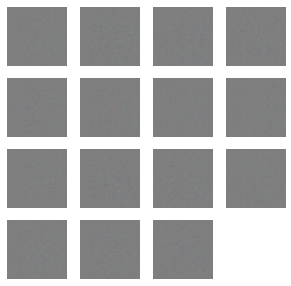

In [106]:
seed = tf.random.normal(shape =(16,100))
show_image(generator, seed)

epoch: 1 ============================


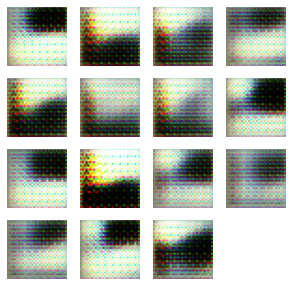

epoch: 2 ============================


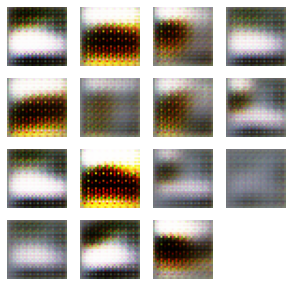

epoch: 3 ============================


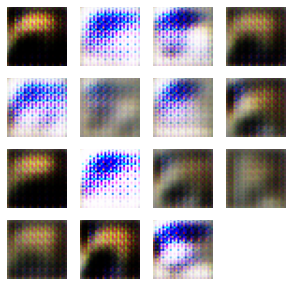

epoch: 4 ============================


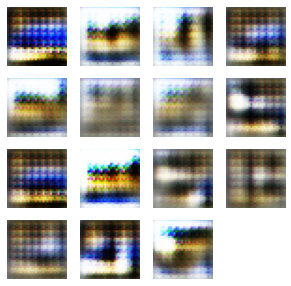

epoch: 5 ============================


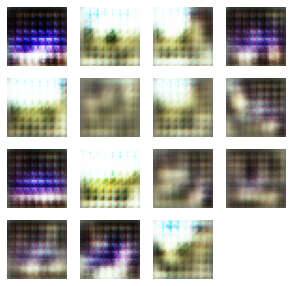

epoch: 6 ============================


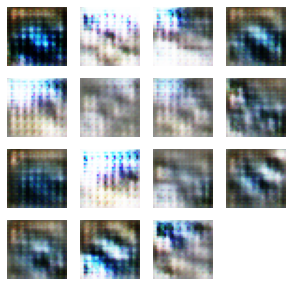

epoch: 7 ============================


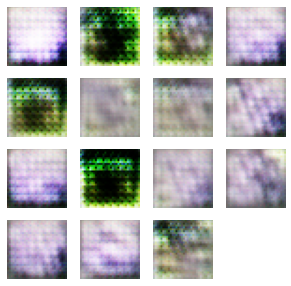

epoch: 8 ============================


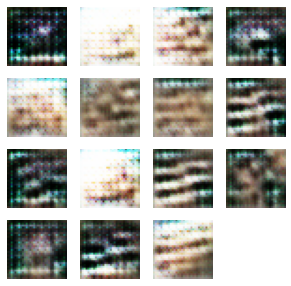

epoch: 9 ============================


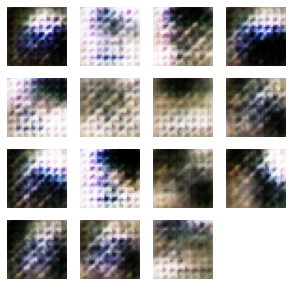

epoch: 10 ============================


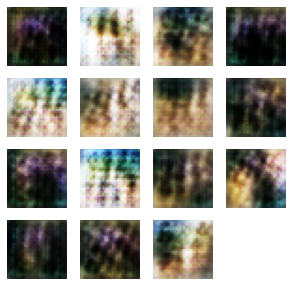

epoch: 11 ============================


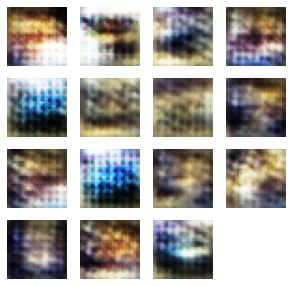

epoch: 12 ============================


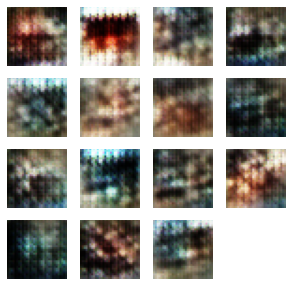

epoch: 13 ============================


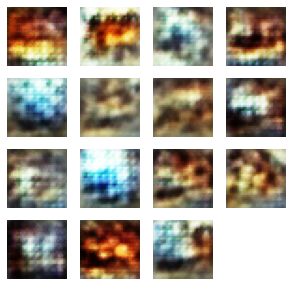

epoch: 14 ============================


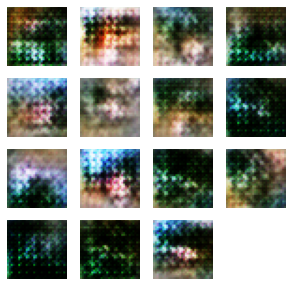

epoch: 15 ============================


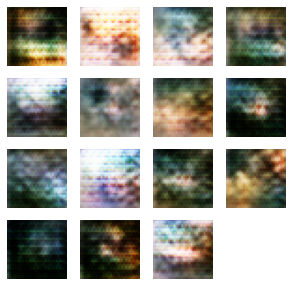

epoch: 16 ============================


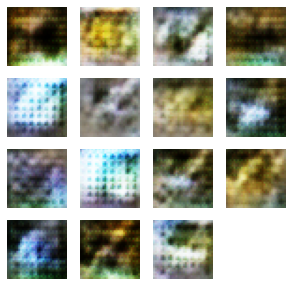

epoch: 17 ============================


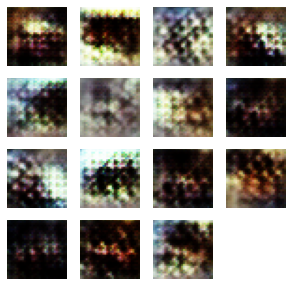

epoch: 18 ============================


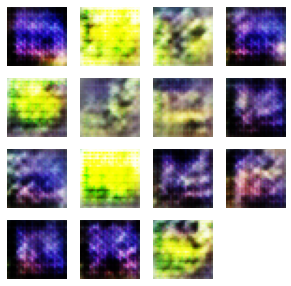

epoch: 19 ============================


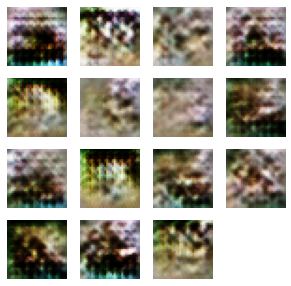

epoch: 20 ============================


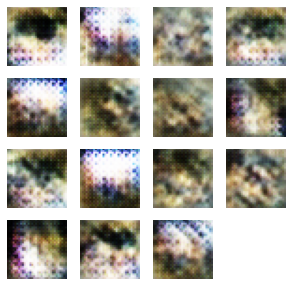

epoch: 21 ============================


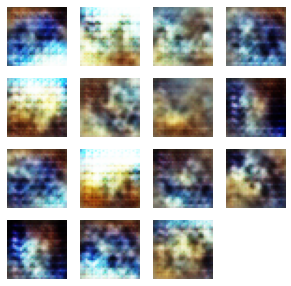

epoch: 22 ============================


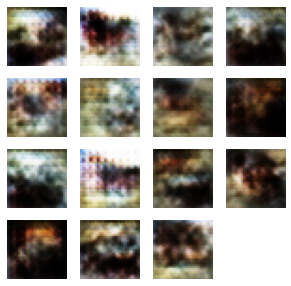

epoch: 23 ============================


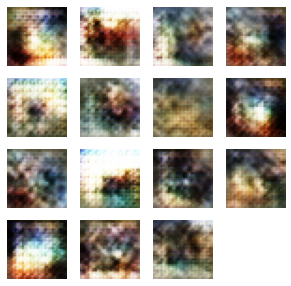

epoch: 24 ============================


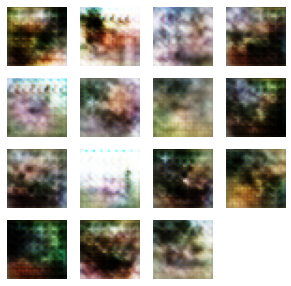

epoch: 25 ============================


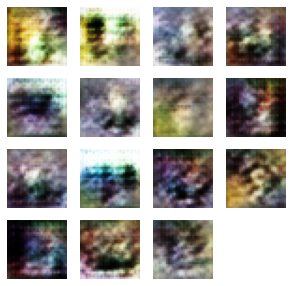

epoch: 26 ============================


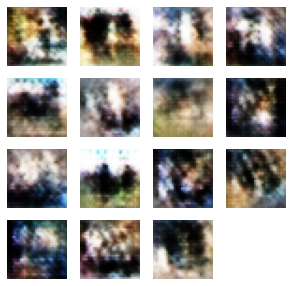

epoch: 27 ============================


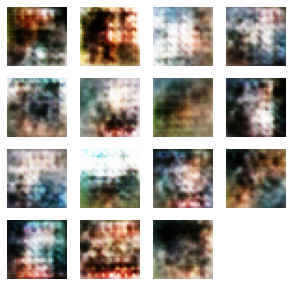

epoch: 28 ============================


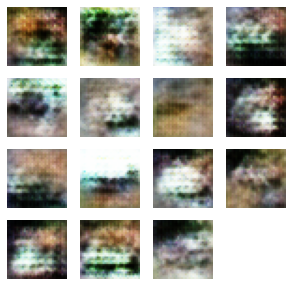

epoch: 29 ============================


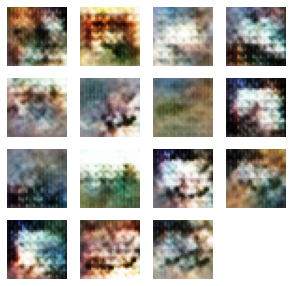

epoch: 30 ============================


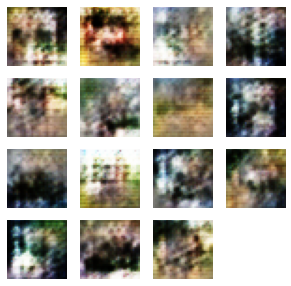

epoch: 31 ============================


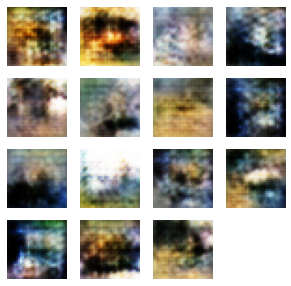

epoch: 32 ============================


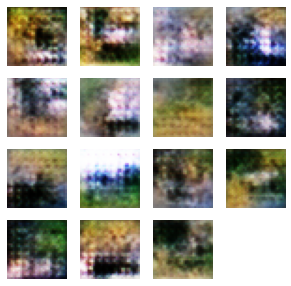

epoch: 33 ============================


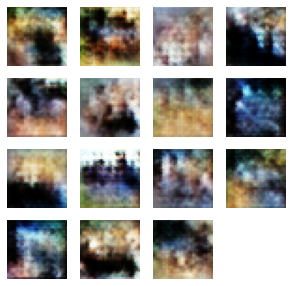

epoch: 34 ============================


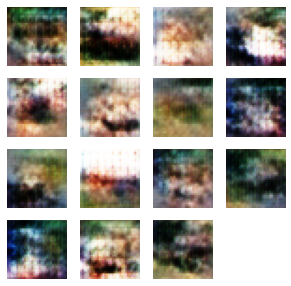

epoch: 35 ============================


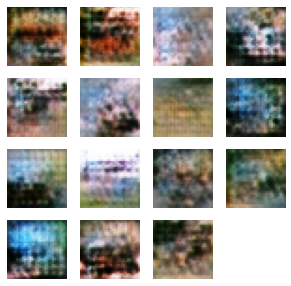

epoch: 36 ============================


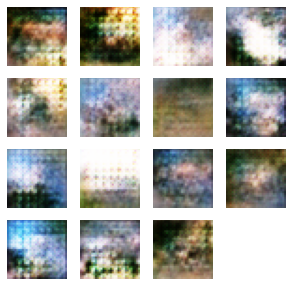

epoch: 37 ============================


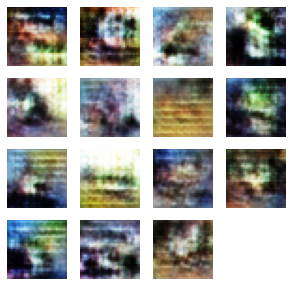

epoch: 38 ============================


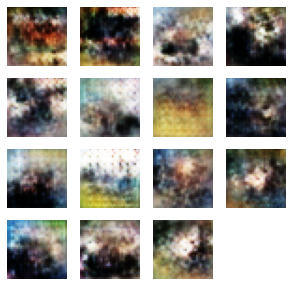

epoch: 39 ============================


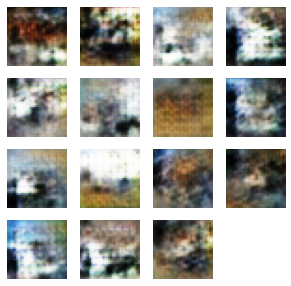

epoch: 40 ============================


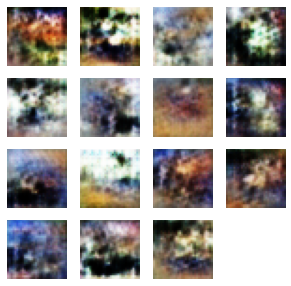

epoch: 41 ============================


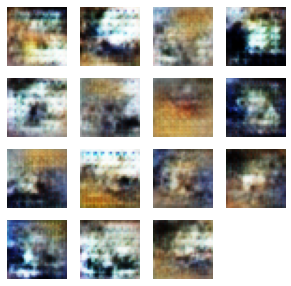

epoch: 42 ============================


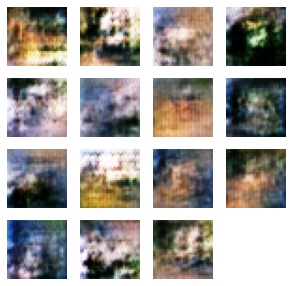

epoch: 43 ============================


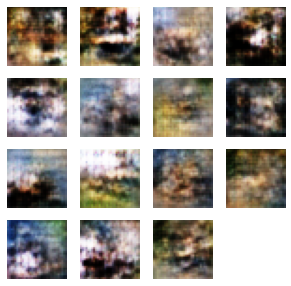

epoch: 44 ============================


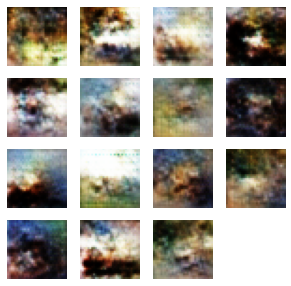

epoch: 45 ============================


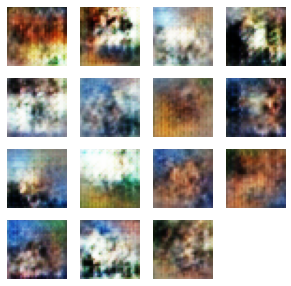

epoch: 46 ============================


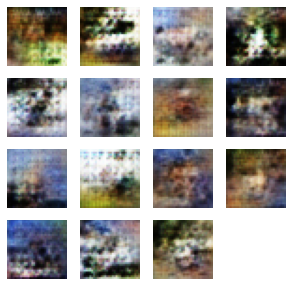

epoch: 47 ============================


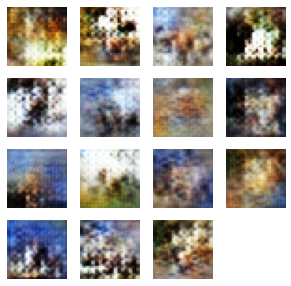

epoch: 48 ============================


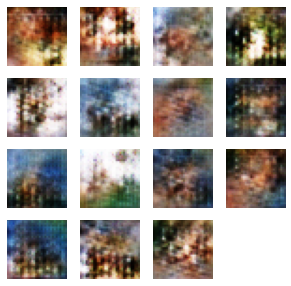

epoch: 49 ============================


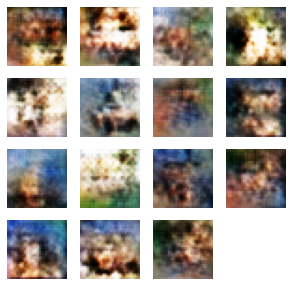

epoch: 50 ============================


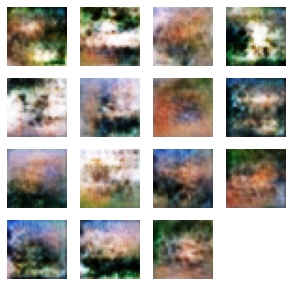

epoch: 51 ============================


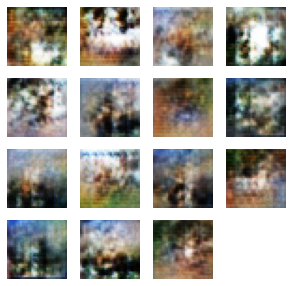

epoch: 52 ============================


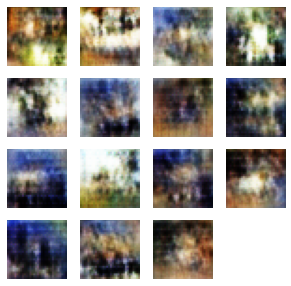

epoch: 53 ============================


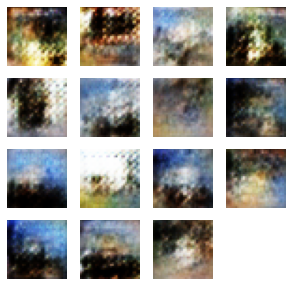

epoch: 54 ============================


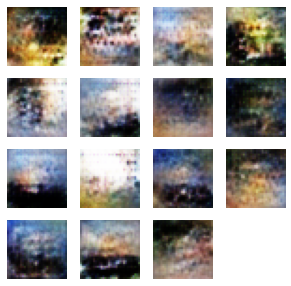

epoch: 55 ============================


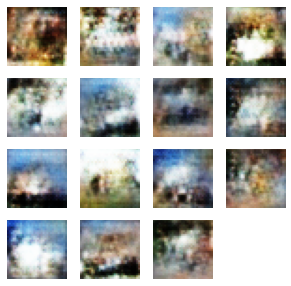

epoch: 56 ============================


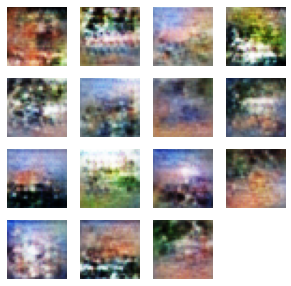

epoch: 57 ============================


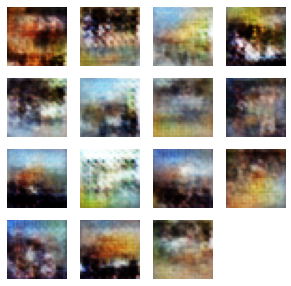

epoch: 58 ============================


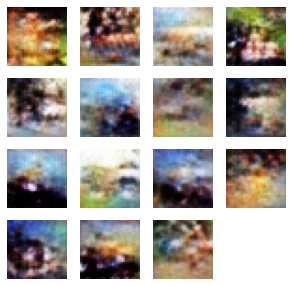

epoch: 59 ============================


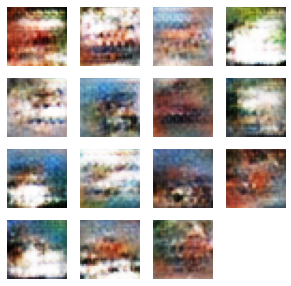

epoch: 60 ============================


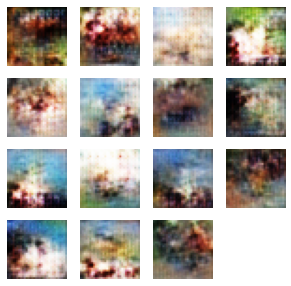

epoch: 61 ============================


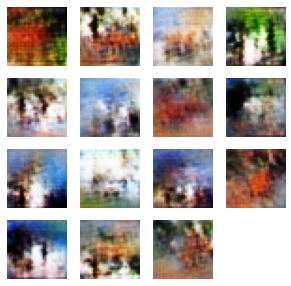

epoch: 62 ============================


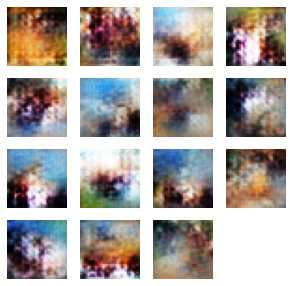

epoch: 63 ============================


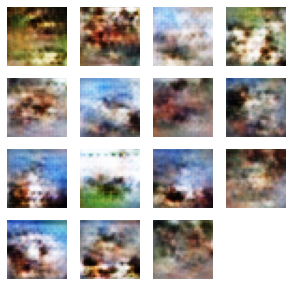

epoch: 64 ============================


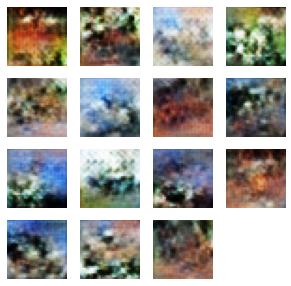

epoch: 65 ============================


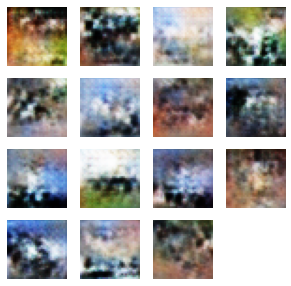

epoch: 66 ============================


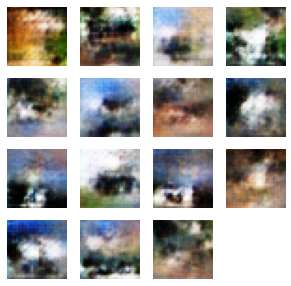

epoch: 67 ============================


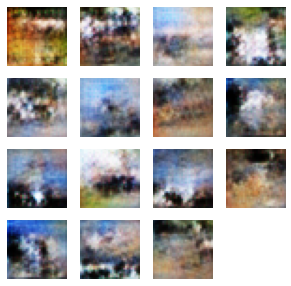

epoch: 68 ============================


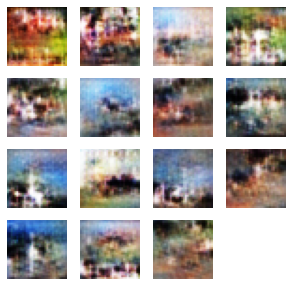

epoch: 69 ============================


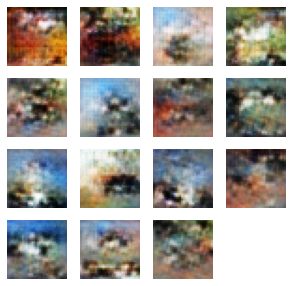

epoch: 70 ============================


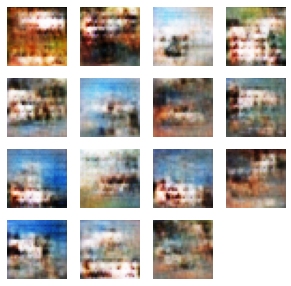

epoch: 71 ============================


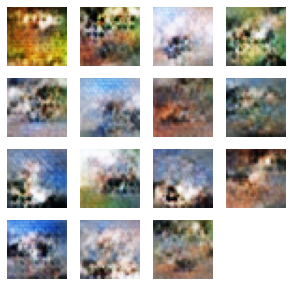

epoch: 72 ============================


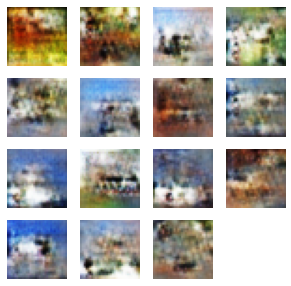

epoch: 73 ============================


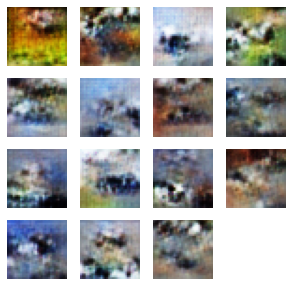

epoch: 74 ============================


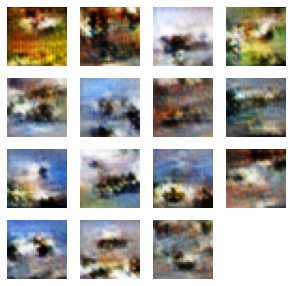

epoch: 75 ============================


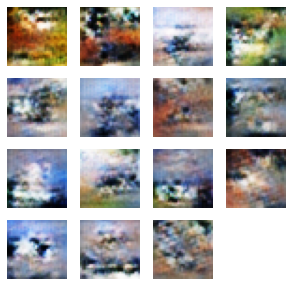

epoch: 76 ============================


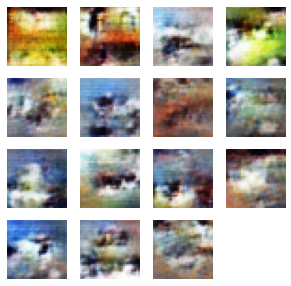

epoch: 77 ============================


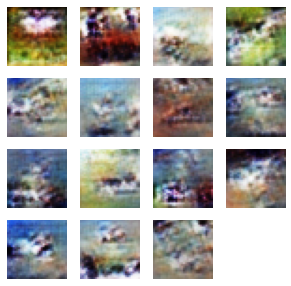

epoch: 78 ============================


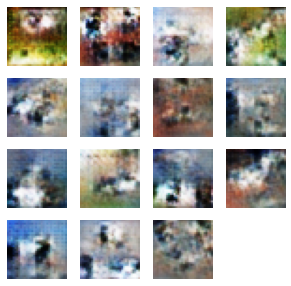

epoch: 79 ============================


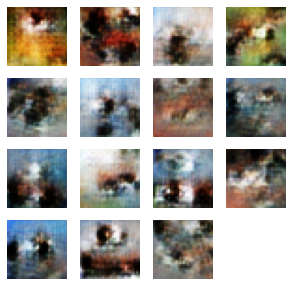

epoch: 80 ============================


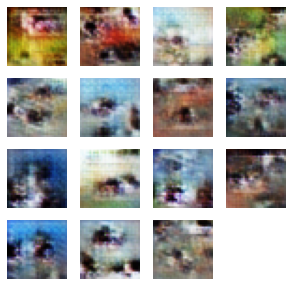

epoch: 81 ============================


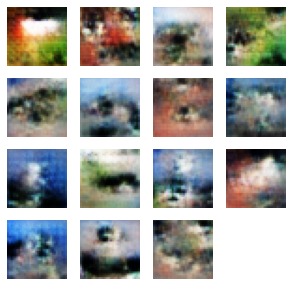

epoch: 82 ============================


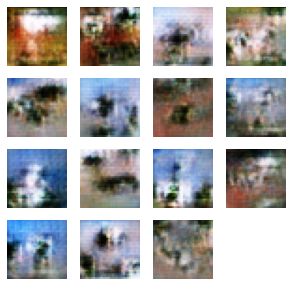

epoch: 83 ============================


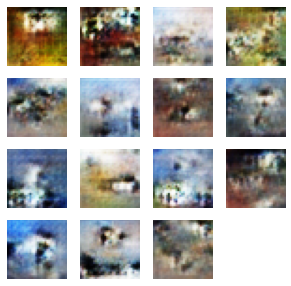

epoch: 84 ============================


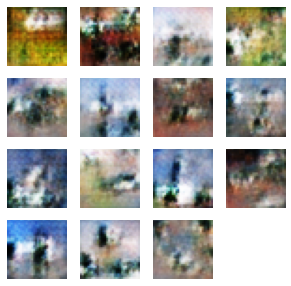

epoch: 85 ============================


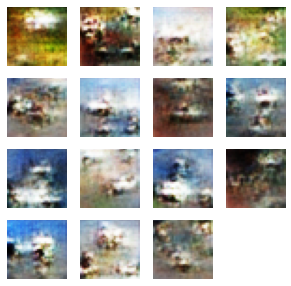

epoch: 86 ============================


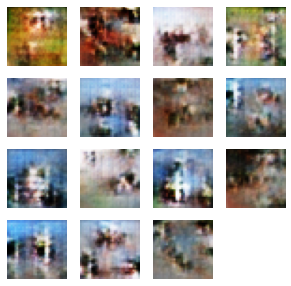

epoch: 87 ============================


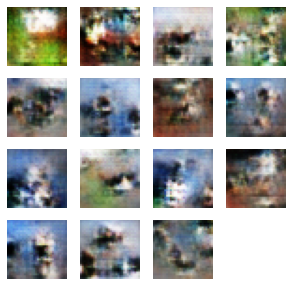

epoch: 88 ============================


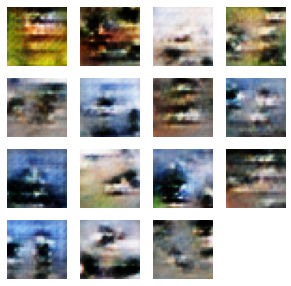

epoch: 89 ============================


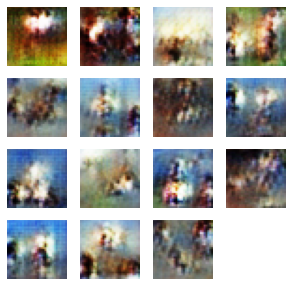

epoch: 90 ============================


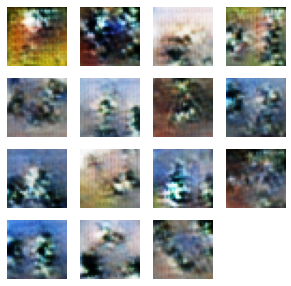

epoch: 91 ============================


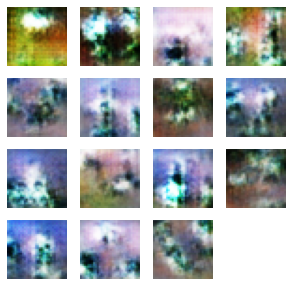

epoch: 92 ============================


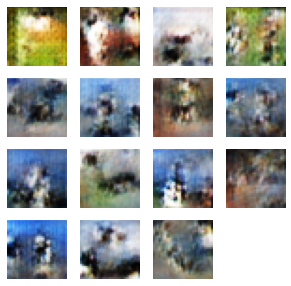

epoch: 93 ============================


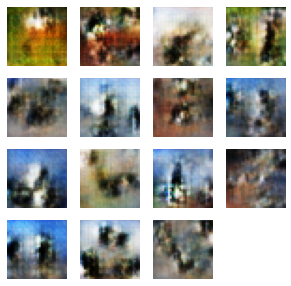

epoch: 94 ============================


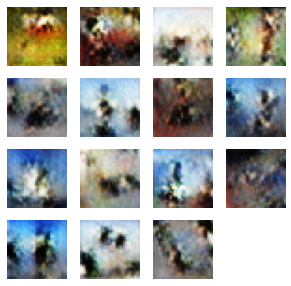

epoch: 95 ============================


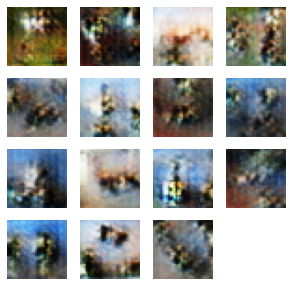

epoch: 96 ============================


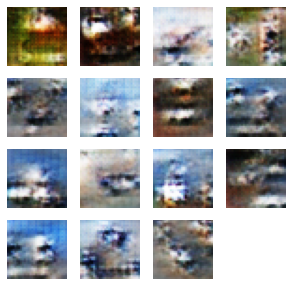

epoch: 97 ============================


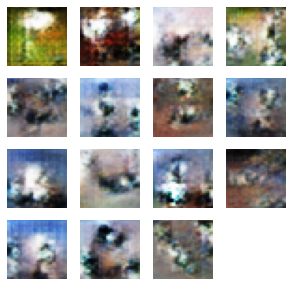

epoch: 98 ============================


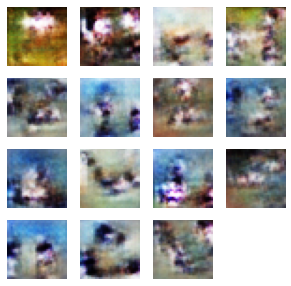

epoch: 99 ============================


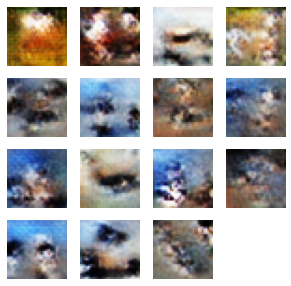

epoch: 100 ============================


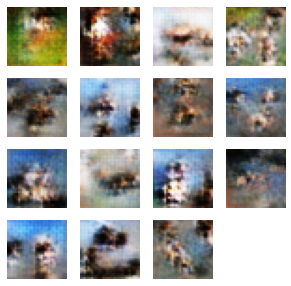

In [107]:
EPOCHS = 100 

for epoch in range(EPOCHS):
  print(f"epoch: {epoch+1} ============================")
  
  for img in train_data:
    train(img) 

  show_image(generator, seed)